In [2]:
# Step 1: Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning models (Import)
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

# Model utilities required
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score


# Step 2: Load the dataset from given path
file_path = r"E:\Analytics club\edgar-co2-emissions.csv"
df = pd.read_csv(file_path)

# Step 3: View first few rows of dataset
print("First 5 Rows of the Dataset:")
print(df.head())

print("\nDataset shape:")
print(df.shape)


First 5 Rows of the Dataset:
  Code         Name          Sector  Year  Emissions
0  AFG  Afghanistan  Power Industry  1970   0.056962
1  ALB      Albania  Power Industry  1970   0.600624
2  DZA      Algeria  Power Industry  1970   1.645869
3  AGO       Angola  Power Industry  1970   0.137546
4  AIA     Anguilla  Power Industry  1970   0.000430

Dataset shape:
(50764, 5)


In [4]:
# Step 4: Rename column 'Name' to 'country'
df.rename(columns={"Name": "country"}, inplace=True)

# Verify the change
print(df.columns)
print(df.head())


Index(['Code', 'country', 'Sector', 'Year', 'Emissions'], dtype='object')
  Code      country          Sector  Year  Emissions
0  AFG  Afghanistan  Power Industry  1970   0.056962
1  ALB      Albania  Power Industry  1970   0.600624
2  DZA      Algeria  Power Industry  1970   1.645869
3  AGO       Angola  Power Industry  1970   0.137546
4  AIA     Anguilla  Power Industry  1970   0.000430


In [7]:
# Step 5: Sort by country, then sector, then date
df_sorted = df.sort_values(by=['country', 'Sector', 'Year'], ascending=True).reset_index(drop=True)

# Show first 10 rows to verify
print(df_sorted.head(10))

  Code      country     Sector  Year  Emissions
0  AFG  Afghanistan  Buildings  1970   0.577234
1  AFG  Afghanistan  Buildings  1971   0.577234
2  AFG  Afghanistan  Buildings  1972   0.463342
3  AFG  Afghanistan  Buildings  1973   0.574055
4  AFG  Afghanistan  Buildings  1974   0.768488
5  AFG  Afghanistan  Buildings  1975   0.590190
6  AFG  Afghanistan  Buildings  1976   0.476773
7  AFG  Afghanistan  Buildings  1977   0.427984
8  AFG  Afghanistan  Buildings  1978   0.405834
9  AFG  Afghanistan  Buildings  1979   0.476840


In [9]:
# Step 6: Count how many unique sectors are there
num_sectors = df['Sector'].nunique()

print("Number of sectors:", num_sectors)
# Get all unique sector names
sectors = df['Sector'].unique()

print("Sectors in the dataset:")
for s in sectors:
    print("-", s)

# Count records for each sector
sector_counts = df['Sector'].value_counts()

print(sector_counts)

Number of sectors: 5
Sectors in the dataset:
- Power Industry
- Buildings
- Transport
- Other industrial combustion
- Other sectors
Sector
Transport                      10241
Other sectors                  10192
Power Industry                 10143
Buildings                      10094
Other industrial combustion    10094
Name: count, dtype: int64


In [11]:
#Step 7: Grouping the data
df.groupby(['country', 'Sector'])['Emissions'].mean().reset_index()

,country,Sector,Emissions
0,Afghanistan,Buildings,0.582241
1,Afghanistan,Other industrial combustion,0.148981
2,Afghanistan,Other sectors,0.376172
3,Afghanistan,Power Industry,0.867594
4,Afghanistan,Transport,1.310930
...,...,...,...
1031,Zimbabwe,Buildings,1.839367
1032,Zimbabwe,Other industrial combustion,2.720017
1033,Zimbabwe,Other sectors,1.258117
1034,Zimbabwe,Power Industry,4.437478


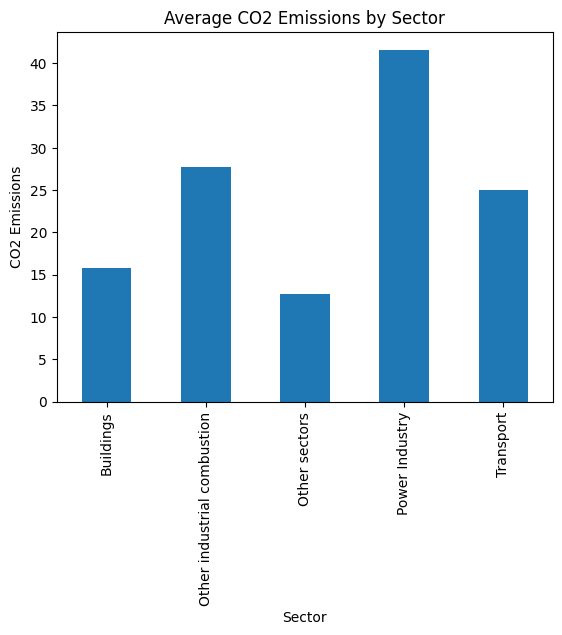

In [12]:
# Step 8: Understanding the contribution to CO2 emission by each sector for all countries
import matplotlib.pyplot as plt

df.groupby('Sector')['Emissions'].mean().plot(kind='bar')
plt.title("Average CO2 Emissions by Sector")
plt.ylabel("CO2 Emissions")
plt.show()

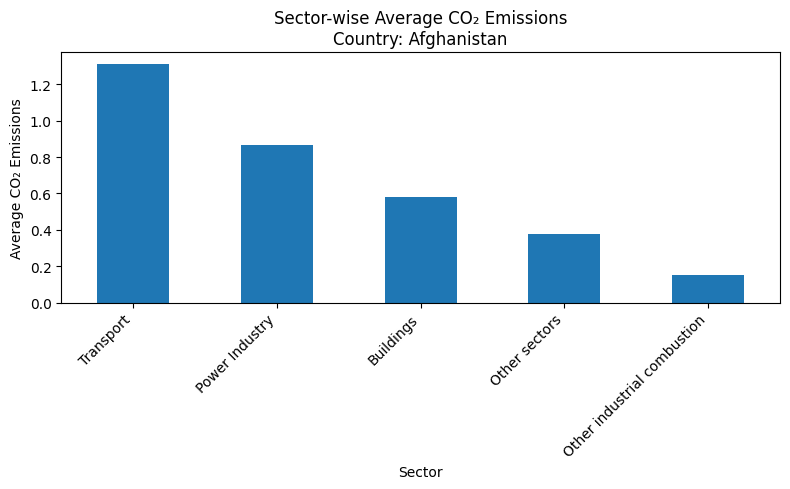

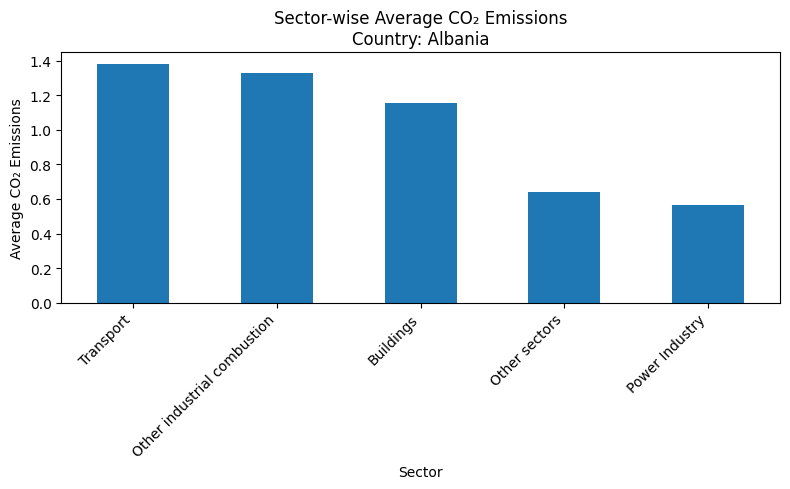

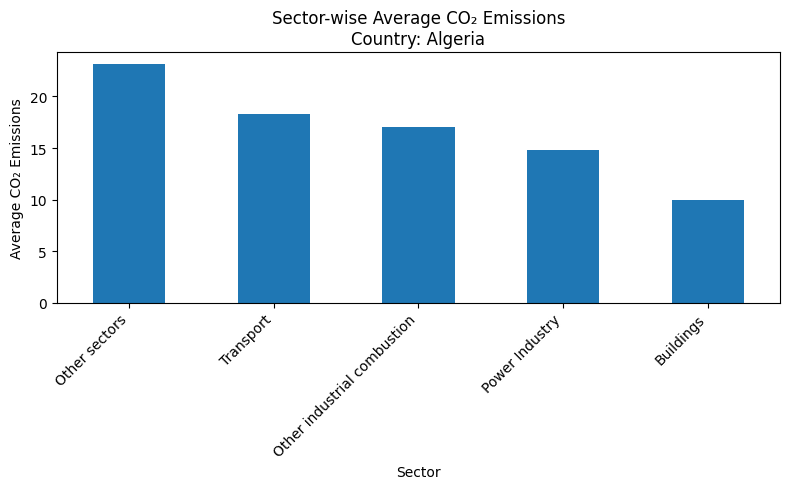

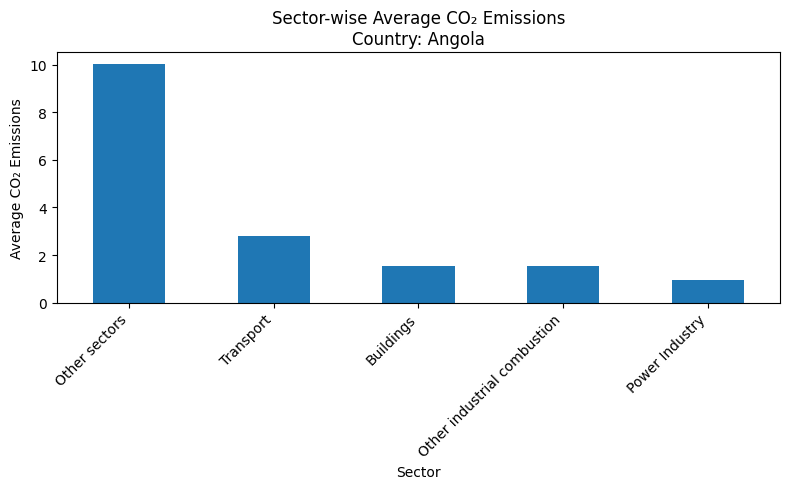

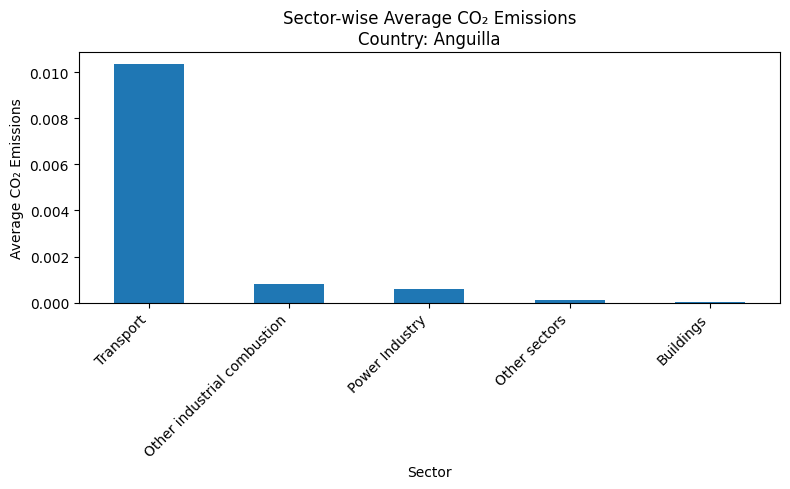

...

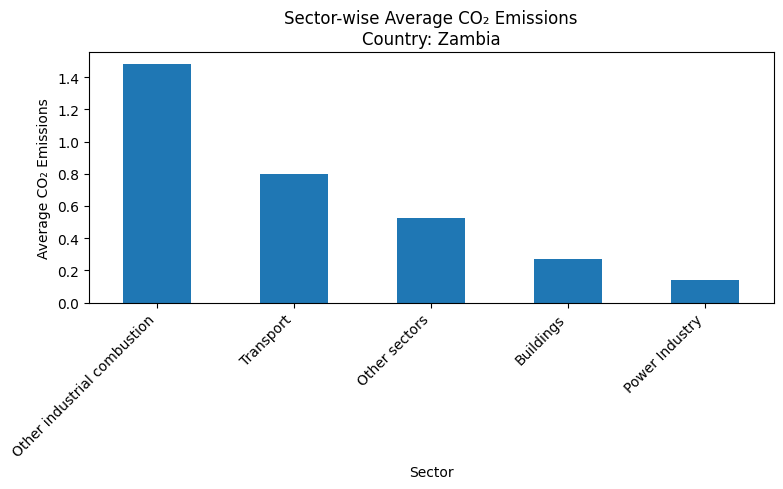

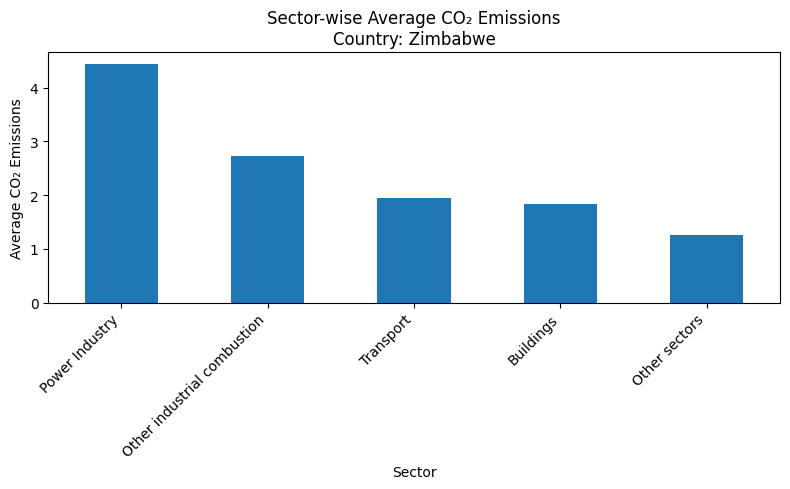

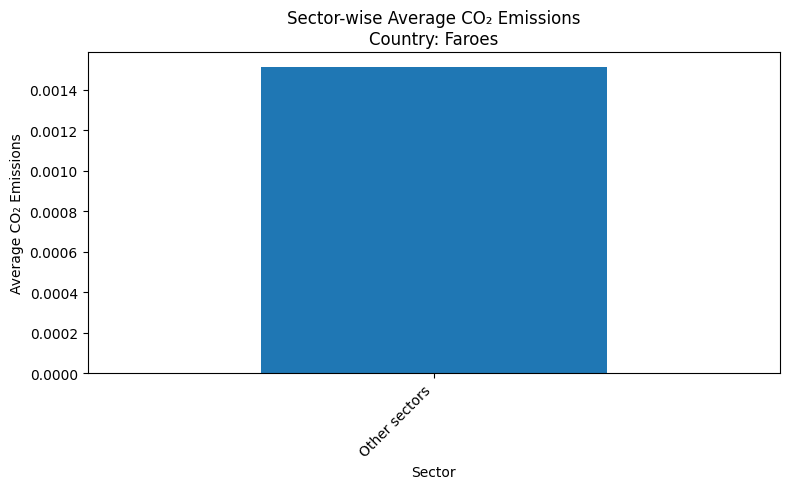

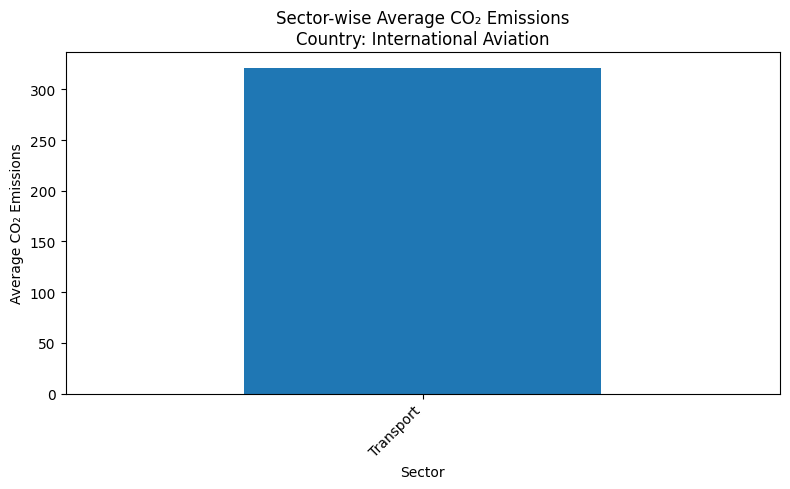

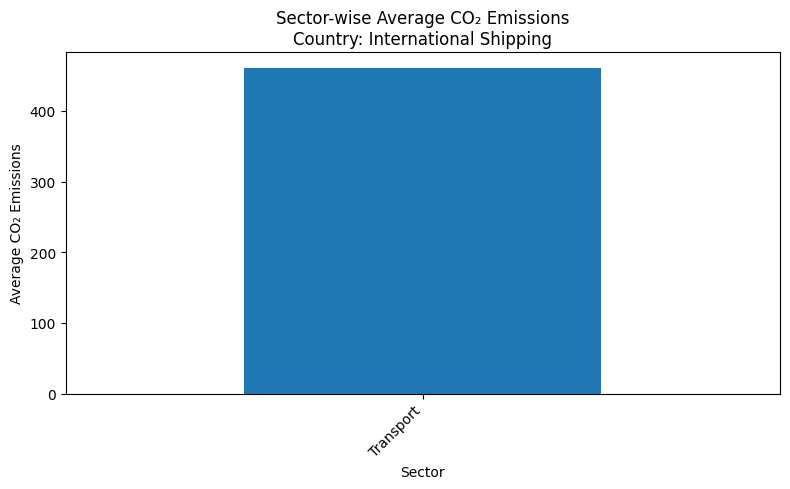

In [51]:
# Step 9: Understanding the contribution of each sector in CO2 emission for countries individually
# Rename value column for clarity
df.rename(columns={'Emissions': 'CO2_emissions'}, inplace=True)

# Getting list of unique countries
countries = df['country'].unique()

# Looping through each country
for country in countries:
    # Filter data for the country
    country_df = df[df['country'] == country]
    
    # Calculate average CO2 emissions per sector
    sector_emissions = (
        country_df
        .groupby('Sector')['CO2_emissions']
        .mean()
        .sort_values(ascending=False)
    )
    
    # Plot
    plt.figure(figsize=(8, 5))
    sector_emissions.plot(kind='bar')
    
    plt.title(f"Sector-wise Average CO₂ Emissions\nCountry: {country}")
    plt.xlabel("Sector")
    plt.ylabel("Average CO₂ Emissions")
    plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()

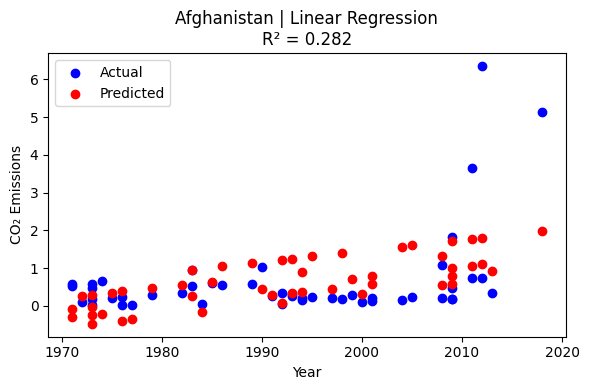

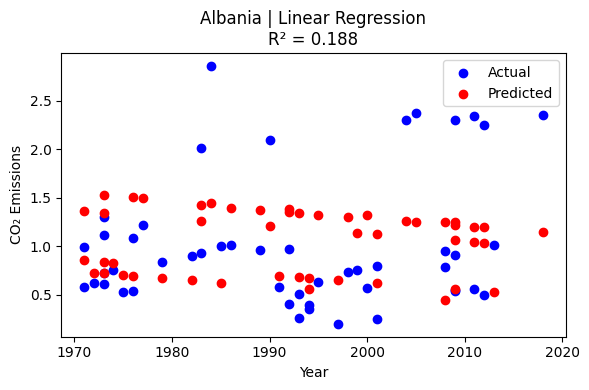

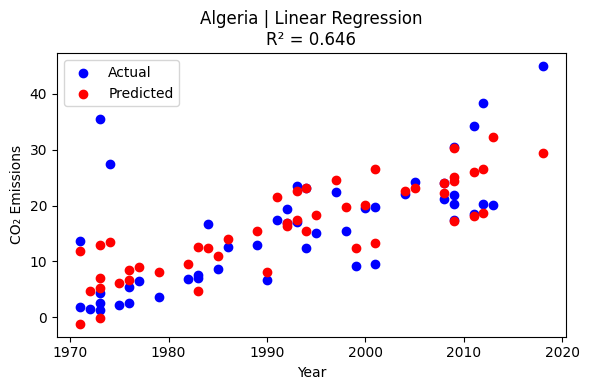

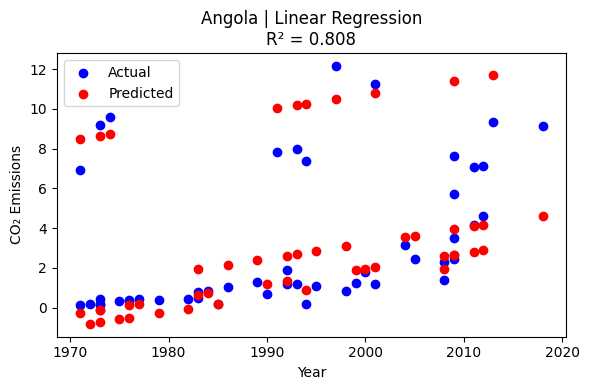

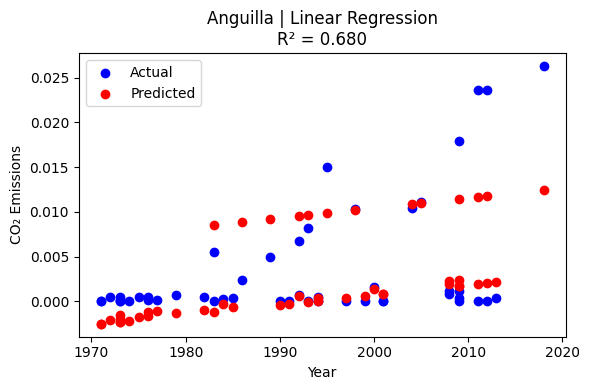

...

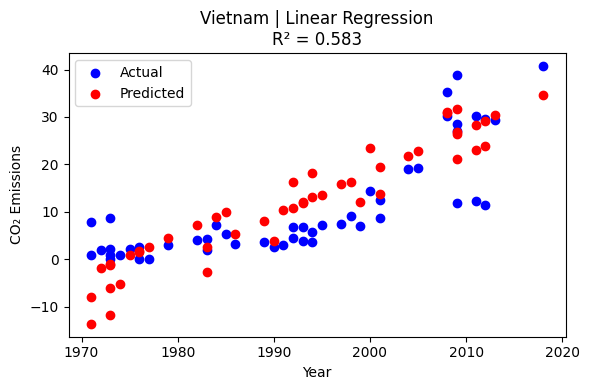

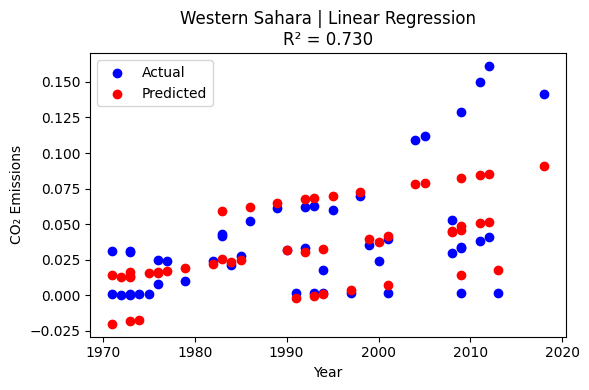

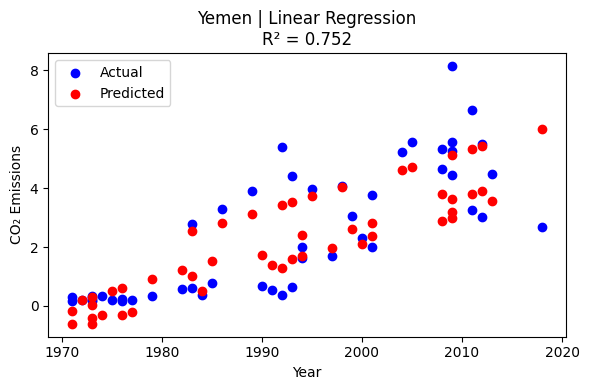

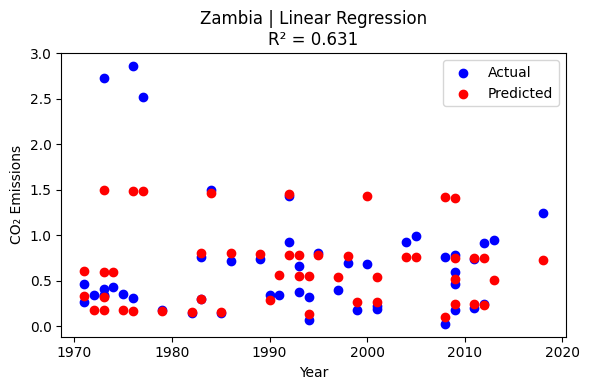

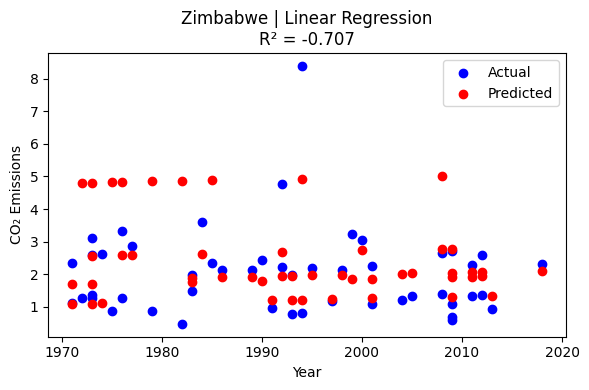

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score


# Load the dataset
file_path = r"E:\Analytics club\edgar-co2-emissions.csv"
df = pd.read_csv(file_path)

# Clean & rename columns
df.drop(columns=["Code"], inplace=True)
df.rename(columns={"Name": "country", "Emissions": "CO2_emissions"}, inplace=True)

# Handle missing values
df["CO2_emissions"] = df["CO2_emissions"].fillna(df["CO2_emissions"].median())

# One-hot encode Sector
df_encoded = pd.get_dummies(df, columns=["Sector"], drop_first=False)

countries = sorted(df_encoded["country"].unique())

for country in countries:
    # Filter country data
    df_country = df_encoded[df_encoded["country"] == country]

    # Skip small datasets
    if len(df_country) < 5:
        continue

    # Features and target
    X = df_country.drop(columns=["CO2_emissions", "country"])
    y = df_country["CO2_emissions"]

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train Linear Regression
    lr = LinearRegression()
    lr.fit(X_train, y_train)

    # Predictions
    y_pred = lr.predict(X_test)

    # R2 score
    r2 = r2_score(y_test, y_pred)

    # Plot (Year vs Emissions)
    plt.figure(figsize=(6, 4))
    plt.scatter(X_test["Year"], y_test, color="blue", label="Actual")
    plt.scatter(X_test["Year"], y_pred, color="red", label="Predicted")

    plt.xlabel("Year")
    plt.ylabel("CO₂ Emissions")
    plt.title(f"{country} | Linear Regression\nR² = {r2:.3f}")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [46]:
#For Random Forest model:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score


# Load the dataset
file_path = r"E:\Analytics club\edgar-co2-emissions.csv"
df = pd.read_csv(file_path)


# Clean & rename columns

df.drop(columns=["Code"], inplace=True)
df.rename(columns={"Name": "country", "Emissions": "CO2_emissions"}, inplace=True)

# Handle missing values
df["CO2_emissions"] = df["CO2_emissions"].fillna(df["CO2_emissions"].median())

# One-hot encode Sector
df_encoded = pd.get_dummies(df, columns=["Sector"], drop_first=False)

# Get list of countries
countries = sorted(df_encoded["country"].unique())


# Random Forest per country

for country in countries:
    # Filter country data
    df_country = df_encoded[df_encoded["country"] == country]

    # Skip countries with too few records
    if len(df_country) < 5:
        continue

    # Features & target
    X = df_country.drop(columns=["CO2_emissions", "country"])
    y = df_country["CO2_emissions"]

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train Random Forest Regressor
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)

    # Predictions
    y_pred = rf.predict(X_test)

    # R2 score
    r2 = r2_score(y_test, y_pred)

    # Plot Year vs Emissions
    plt.figure(figsize=(6, 4))
    plt.scatter(X_test["Year"], y_test, color="blue", label="Actual")
    plt.scatter(X_test["Year"], y_pred, color="red", label="Predicted")

    plt.xlabel("Year")
    plt.ylabel("CO₂ Emissions")
    plt.title(f"{country} | Random Forest\nR² = {r2:.3f}")
    plt.legend()
    plt.tight_layout()
    plt.close()


In [47]:
#For XGBooster model:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score


# Load the dataset

file_path = r"E:\Analytics club\edgar-co2-emissions.csv"
df = pd.read_csv(file_path)


#  Clean & rename columns

df.drop(columns=["Code"], inplace=True)
df.rename(columns={"Name": "country", "Emissions": "CO2_emissions"}, inplace=True)

# Handle missing values
df["CO2_emissions"] = df["CO2_emissions"].fillna(df["CO2_emissions"].median())

# One-hot encode Sector
df_encoded = pd.get_dummies(df, columns=["Sector"], drop_first=False)

# List of countries
countries = sorted(df_encoded["country"].unique())


# XGBoost per country

for country in countries:
    # Filter country data
    df_country = df_encoded[df_encoded["country"] == country]

    # Skip countries with too few records
    if len(df_country) < 5:
        continue

    # Features & target
    X = df_country.drop(columns=["CO2_emissions", "country"])
    y = df_country["CO2_emissions"]

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    # Train XGBoost Regressor
    xgb = XGBRegressor(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=3,
        random_state=42,
        objective="reg:squarederror"
    )
    xgb.fit(X_train, y_train)

    # Predictions
    y_pred = xgb.predict(X_test)

    # R2 score
    r2 = r2_score(y_test, y_pred)

    # Plot Year vs Emissions
    plt.figure(figsize=(6, 4))
    plt.scatter(X_test["Year"], y_test, color="blue", label="Actual")
    plt.scatter(X_test["Year"], y_pred, color="red", label="Predicted")

    plt.xlabel("Year")
    plt.ylabel("CO₂ Emissions")
    plt.title(f"{country} | XGBoost\nR² = {r2:.3f}")
    plt.legend()
    plt.tight_layout()
    plt.close()


In [39]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Example: Assume y_test and y_pred are defined (from any model)
# y_test = actual values
# y_pred = predicted values


# Step 1: Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# Step 2: Calculate MAE
mae = mean_absolute_error(y_test, y_pred)


# Step 3: Calculate R²
r2 = r2_score(y_test, y_pred)


# Step 4: Print results
print(f"Model Evaluation Metrics:")
print(f"RMSE: {rmse:.4f}")
print(f"MAE : {mae:.4f}")
print(f"R²  : {r2:.4f}")


Model Evaluation Metrics:
RMSE: 0.4358
MAE : 0.3005
R²  : 0.8860


Random Forest Feature Importance:
Year                                  0.467295
Sector_Power Industry                 0.447414
Sector_Other industrial combustion    0.052748
Sector_Other sectors                  0.020466
Sector_Transport                      0.006224
Sector_Buildings                      0.005853
dtype: float64


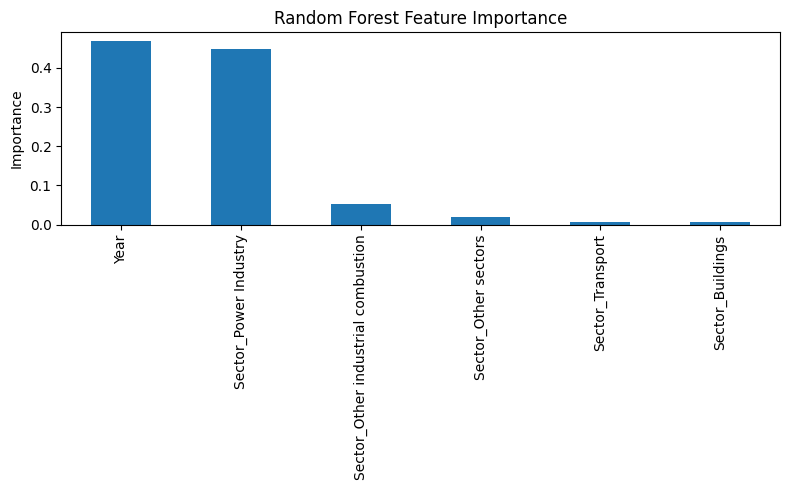

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor

# Assume X_train, y_train already defined for a country
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Extract feature importances
importances = pd.Series(rf.feature_importances_, index=X_train.columns)
importances = importances.sort_values(ascending=False)

# Display
print("Random Forest Feature Importance:")
print(importances)

# Plot
plt.figure(figsize=(8, 5))
importances.plot(kind='bar')
plt.title("Random Forest Feature Importance")
plt.ylabel("Importance")
plt.tight_layout()
plt.show()


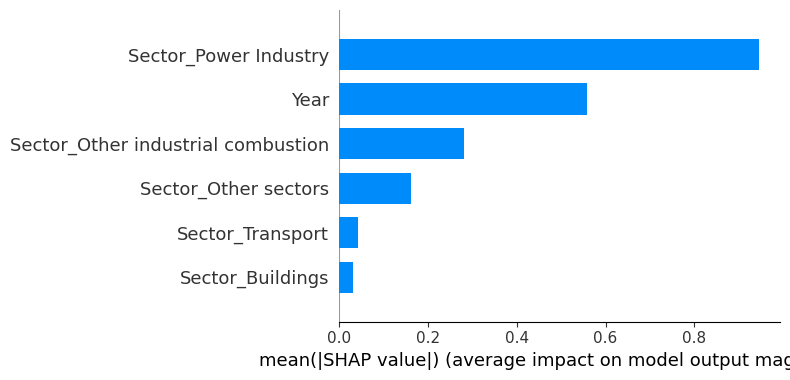

In [44]:
import shap

# Create TreeExplainer for Random Forest
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_train)

# Summary plot
shap.summary_plot(shap_values, X_train, plot_type="bar", show=True)


In [ ]:
#Task 2 and 3 already completed in week 3 assignment